# Advanced Lane Finding Project



## Project Goals:
1. [Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.](#calibration_matrix) 
2. [Apply a distortion correction to raw images](#distortion_correction)
3. [Apply a perspective transform to rectify binary image ("birds-eye view")](#perspective_transform)
4. [Use color transforms, gradients, etc., to create a thresholded binary image](#color_transform)
5. [Detect lane pixels and fit to find the lane boundary.](#lane_detection)
6. [Determine the curvature of the lane and vehicle position with respect to center](#radius_of_curvature)
7. [Warp the detected lane boundaries back onto the original image.](#image_output)
8. [Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.](#video_output)

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import pickle
from datetime import date
import time

<a id='calibration_matrix'><h2> Calibration Matrix</h2></a>

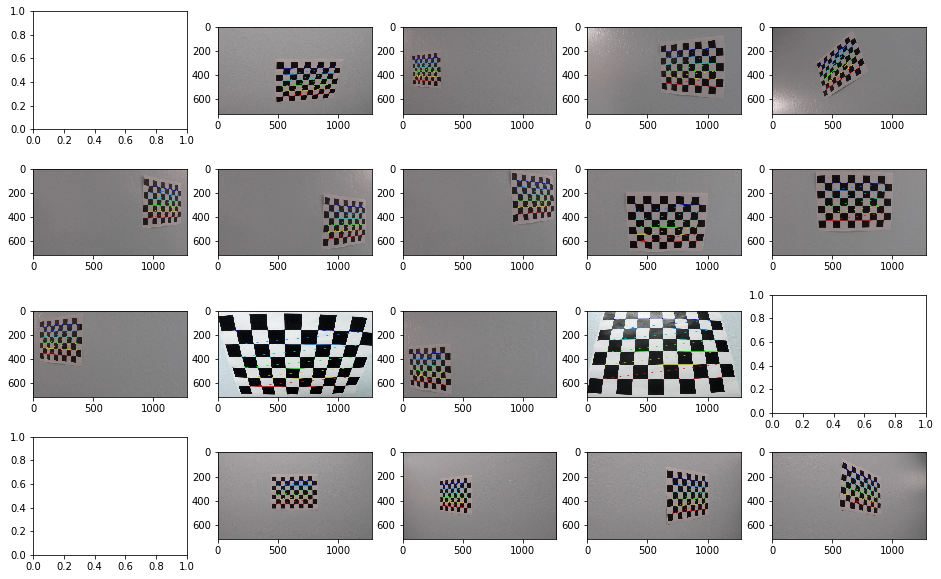

In [2]:
'''
This function calculates corners of the chessboard

Input: 
nx: the number of inside corners in x axis
ny: the number of inside corners in y axis

Output:
objpoints: Object points in 3D space
imgpoints: Image points in 2D space (aka Corners in the image)
'''
def calculate_chessboard_corners(nx, ny):
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    objpoints = []
    imgpoints = []

    input_dir = 'camera_cal/'
    output_dir= 'camera_cal_output/'
    f, ax = plt.subplots(4, 5, figsize=(16,10))
    ax = ax.ravel()
    for idx, fname in enumerate(os.listdir(input_dir)):

        img = cv2.imread(input_dir+fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        if ret == True:
            objpoints+=[objp]
            imgpoints+=[corners]
            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            ax[idx].imshow(img)
    plt.show()
    plt.savefig("output_images/chessboard_corners")
    return objpoints, imgpoints
    

objpoints, imgpoints = calculate_chessboard_corners(9, 6)

<a id="distortion_correction"><h2>Distortion Correction</h2></a>

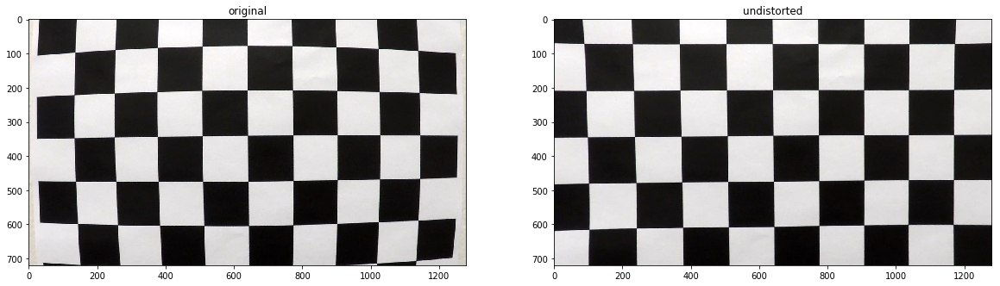

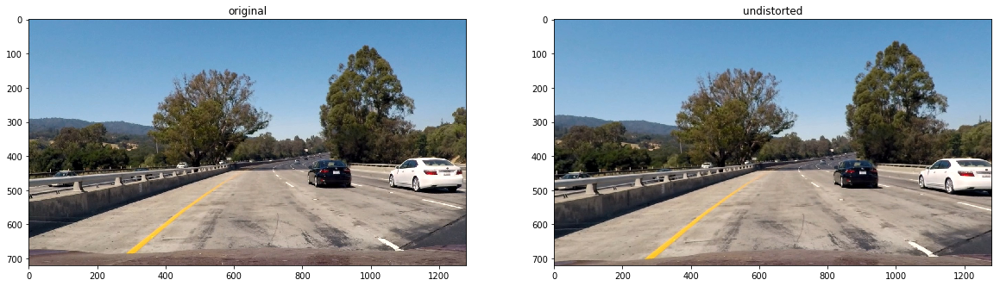

In [3]:
'''
This function undistorts a given image

User has the option of displaying the image and saving the model as well

'''

def get_image(file_name):
    img = cv2.imread(file_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def display_images(img1, img2, title1, title2, gray=False, gray1=False):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    if gray1:
        ax1.imshow(img1, cmap='gray')
    else:
        ax1.imshow(img1)
    
    ax1.set_title(title1)
    
    if gray:
        ax2.imshow(img2, cmap='gray')
    else:
        ax2.imshow(img2)
    ax2.set_title(title2)
    
    f.savefig('output_images/'+title1+'_to_'+title2+'.png') 
    plt.show()

def save_step(obj, title):
    dt = date.today()
    tstr = time.strftime("%H%M%S", time.gmtime(666))
    pickle.dump( obj, open( '%s_%s_%s_%s_%s.pkl' % (title, dt.month, dt.day, dt.year, tstr), "wb" ) )
    

    
def undistort(img, display=True, save=True):
    img_size = (img.shape[1], img.shape[0])

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)                 
                     
    if display:
        display_images(img, dst, 'original', 'undistorted')
    if save:
        save_step({"mtx": mtx, "dist": dist}, 'undistort')
    return dst


file_path = './camera_cal/calibration1.jpg' 
img = get_image(file_path)
result = undistort(img, True, False)

file_path = './test_images/test1.jpg'
img = get_image(file_path)
undistorted_img = undistort(img, True, False)

<a id="perspective_transform"><h2> Perspective Transform </h2> </a>

In [4]:
def get_perspective_transform_points(img, display = True):
    h, w= (img.shape[0], img.shape[1])

    src = np.float32([(600,450),(750,454), (250,680), (1100,680)])
    dst = np.float32([(400,0),(w-400,0),(400,h),(w-400,h)])
    
    if display:
        x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
        y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
        plt.plot(x, y, color='blue', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
        plt.imshow(img)
        plt.title("Perspective Transform Region")
        plt.show()
        plt.savefig("output_images/get_perspective_transform_points.png")
    return src, dst

In [5]:
def perspective_transform(img, src_pts, dest_pts, display=True, save=True):
    img_size = (img.shape[1], img.shape[0])
    
    M = cv2.getPerspectiveTransform(src_pts, dest_pts)
    Minv = cv2.getPerspectiveTransform( dest_pts, src_pts)
    
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    if display:
        display_images(img, warped, "original", "perspective_transform")
    
    if save:
        save_step({"M": M, "Minv": Minv}, "perspective_transform")
    return warped,Minv

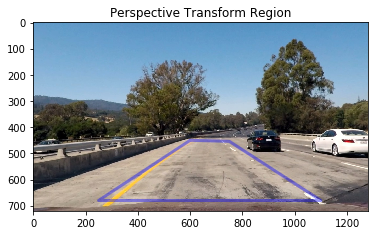

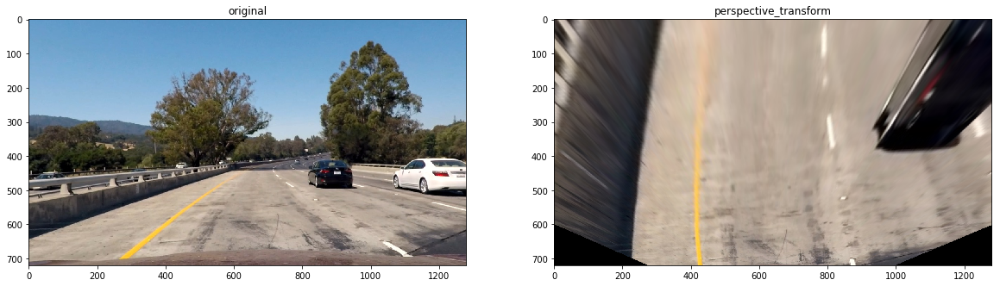

In [6]:
src_pts, dest_pts = get_perspective_transform_points(undistorted_img)
perspective_img,  Minv = perspective_transform(undistorted_img, src_pts, dest_pts)

<a id="color_transform"> <h2>Color Transform</h2> </a>

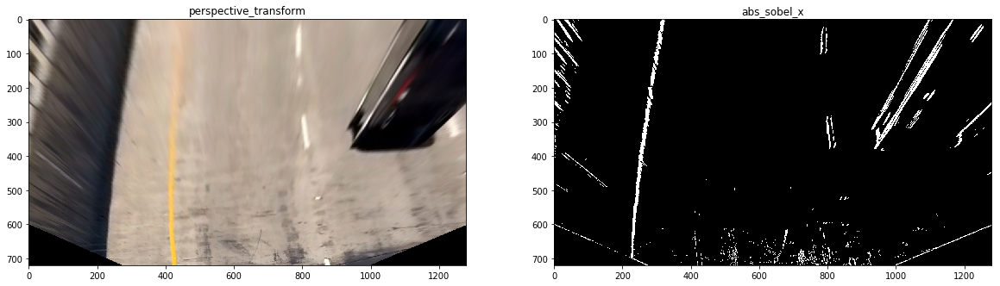

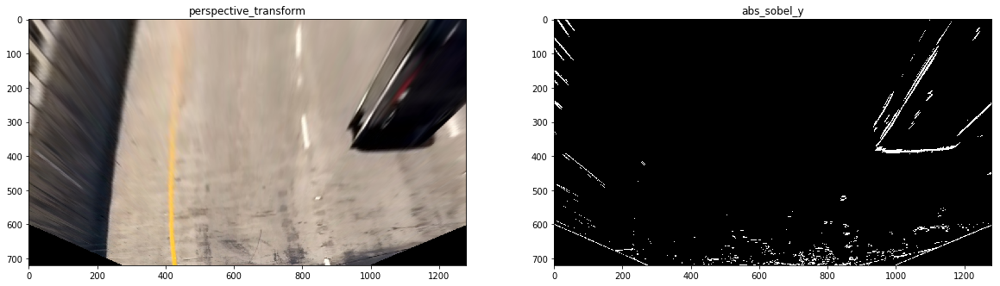

In [7]:
def abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=255, display= True, gray_color=True):
    
    # Apply the following steps to img
    
    # 1) Convert to grayscale
    if gray_color:
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                
    else:
        gray = img

    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    if orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    if display:
        display_images(img, binary_output, "perspective_transform", "abs_sobel_"+orient, True)
    
    return binary_output

abs_sobel_thresh_x_img = abs_sobel_thresh(perspective_img, orient='x')
abs_sobel_thresh_y_img = abs_sobel_thresh(perspective_img, orient='y')

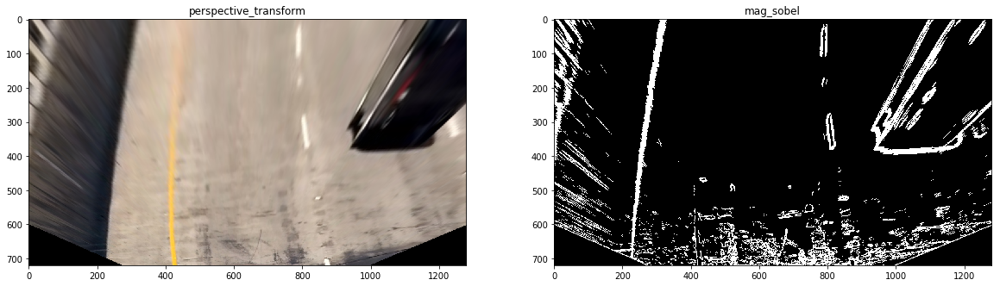

In [8]:
def mag_thresh(img, sobel_kernel=25, mag_thresh=(10, 255), display=True):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = np.copy(sxbinary) 
    
    if display:
        display_images(img, binary_output, "perspective_transform", "mag_sobel", True)
    return binary_output


mag_thresh_img = mag_thresh(perspective_img)

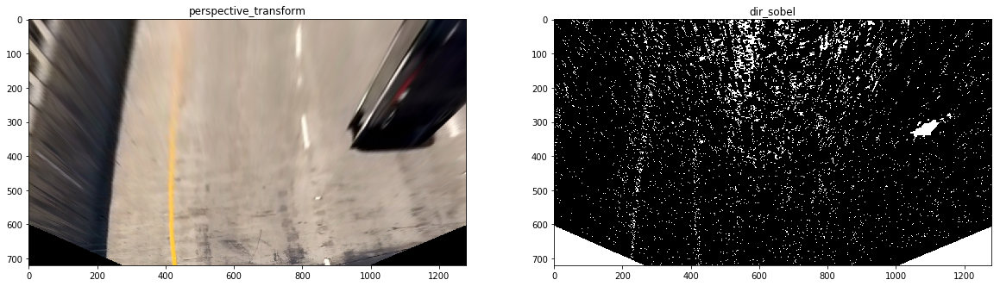

In [9]:
def dir_threshold(img, sobel_kernel=7, thresh=(0, 0.05), display=True):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    abs_sobely = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))

    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    graddir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(graddir)
    # 6) Return this mask as your binary_output image
    binary_output[(graddir >= thresh[0]) & (graddir <= thresh[1])] = 1
    
    if display:
        display_images(img, binary_output, "perspective_transform", "dir_sobel", True)
    return binary_output


dir_threshold_img = dir_threshold(perspective_img)

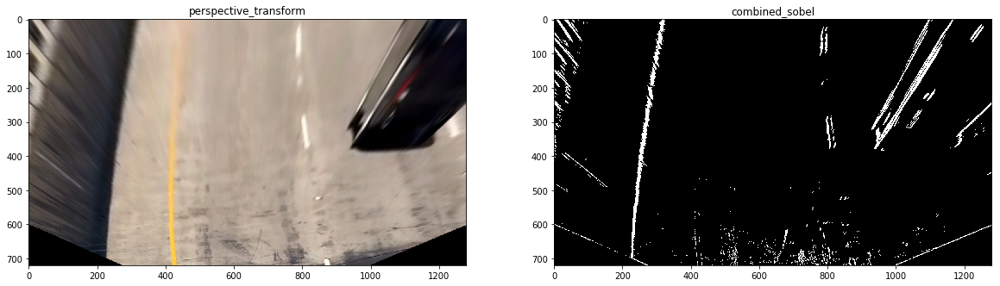

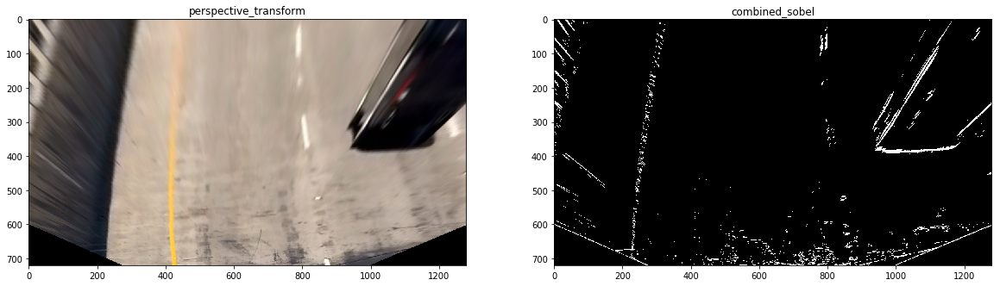

In [10]:
def combined_thresholds(img, grad, mag_binary, dir_binary, display=True ):
    combined = np.zeros_like(dir_binary)
    combined[ (grad == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    if display:
        display_images(img, combined, "perspective_transform", "combined_sobel", True)
    return combined

combined_thresholds_img = combined_thresholds(perspective_img, abs_sobel_thresh_x_img, mag_thresh_img, dir_threshold_img)
combined_thresholds_img_2 = combined_thresholds(perspective_img, abs_sobel_thresh_y_img, mag_thresh_img, dir_threshold_img)

In [11]:
def threshold_color(img, transform, thresh=(0, 255), display=True):
    # 3) Return a binary image of threshold result
    binary_output = np.zeros_like(img)
    binary_output[(img> thresh[0]) & (img<=thresh[1])] = 1
    
    if display:
        display_images(img, binary_output, transform+"_transform ", transform+"_transform_w_threshold", True, False)
    return binary_output


def hls_select(img, idx, transform, display=True):
    hlsimg = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    color_output = hlsimg[:,:,idx]
    
    if display:
        display_images(img, color_output, "original_color", transform+"_transform", True)
    return color_output


def lab_select(img, idx, transform, display=True):
    labimg = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    color_output = labimg[:,:,idx]

    if display:
        display_images(img, color_output, "original_color", transform+"_transform", True)
    return color_output


def rgb_select(img, idx, transform, display=True):
    color_output = img[:,:,idx]
    
    if display:
        display_images(img, color_output, "original_color", transform+"_transform", True)
    return color_output

def lab_select(img, idx, transform, display=True):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    color_output = lab[:,:,idx]
    # don't normalize if there are no yellows in the image
    if np.max(color_output) > 175:
        color_output = color_output*(255/np.max(color_output))
    
    if display:
        display_images(img, color_output, "original_color", transform+"_transform", True)
    return color_output

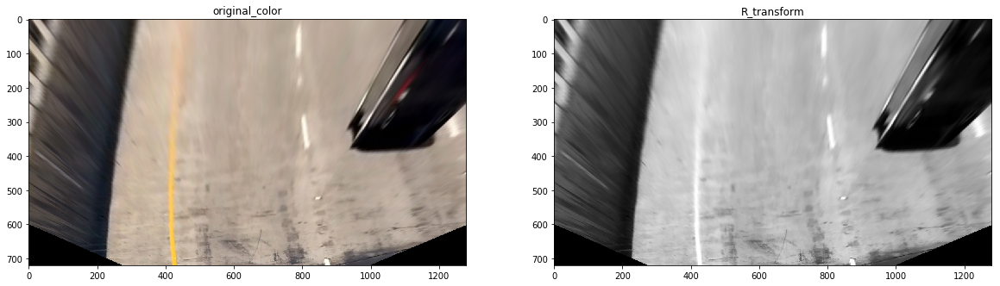

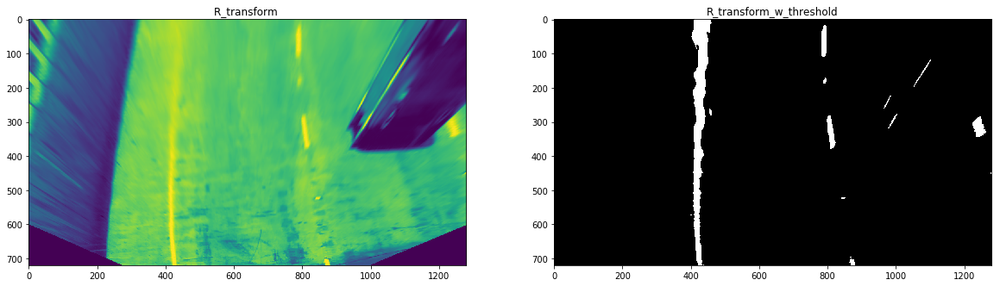

In [12]:
r_img = threshold_color(rgb_select(perspective_img, 0, "R"), "R", (220, 255))

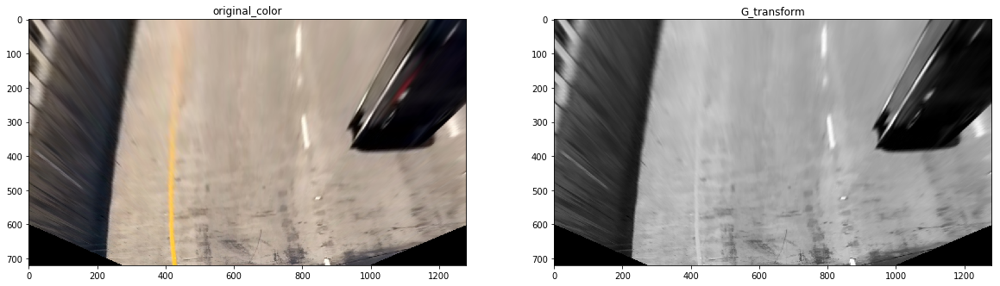

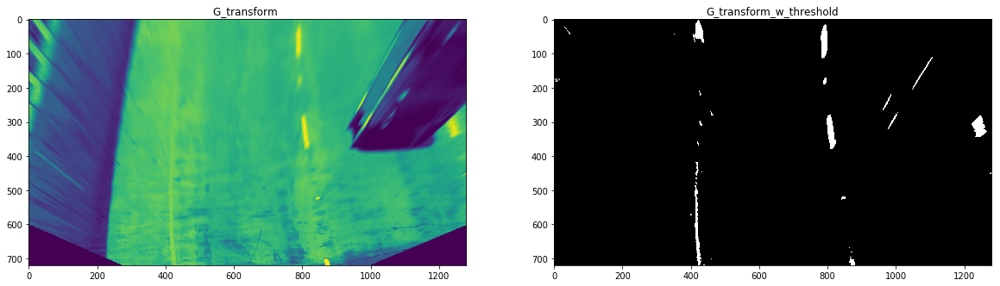

In [13]:
g_img = threshold_color(rgb_select(perspective_img, 1, "G"), "G", (200, 255))

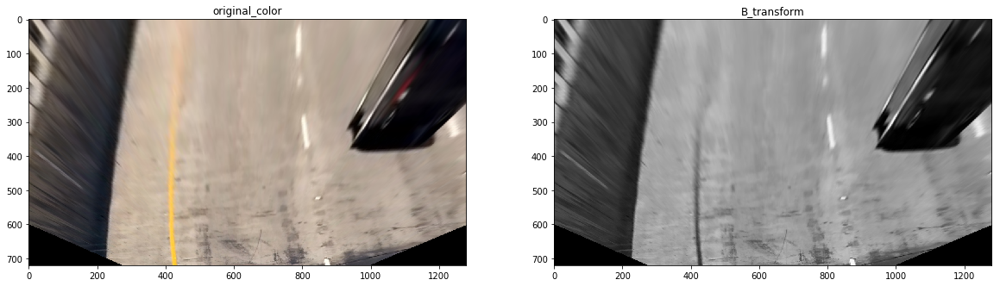

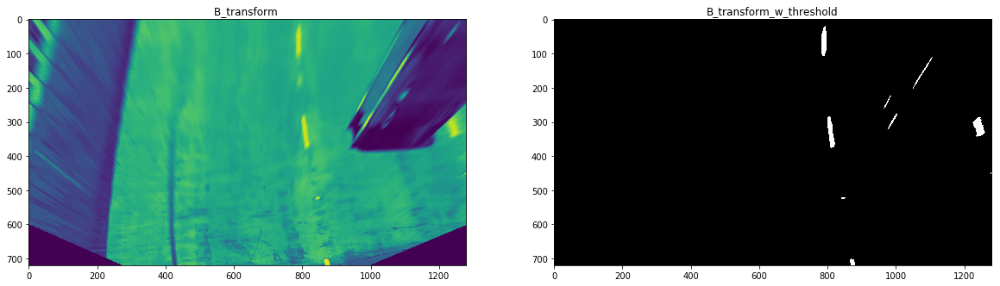

In [14]:
b_img = threshold_color(rgb_select(perspective_img, 2, "B"), "B", (200, 255))

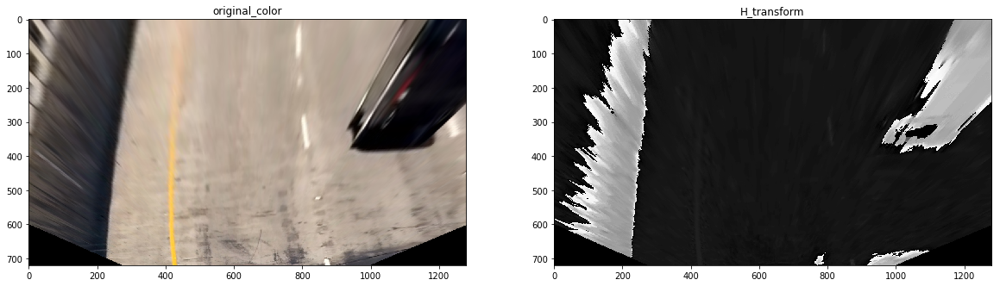

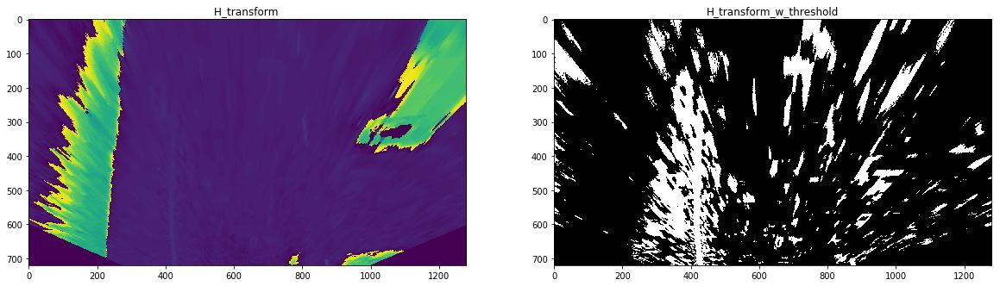

In [15]:
h_img = threshold_color(hls_select(perspective_img, 0, "H"), "H", (15, 100) )

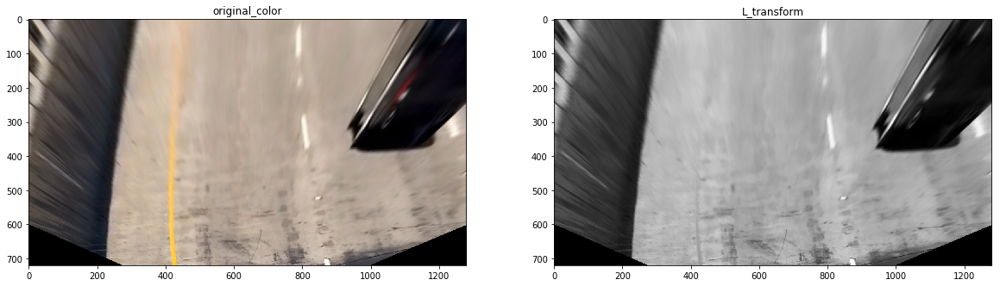

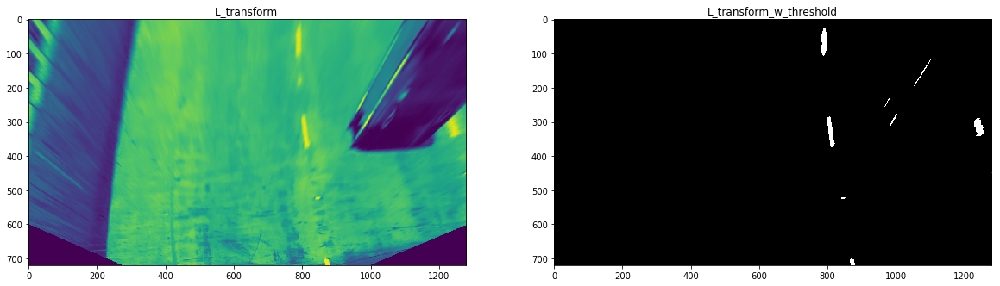

In [16]:
l_img = threshold_color(hls_select(perspective_img, 1, "L"), "L", (220, 255))

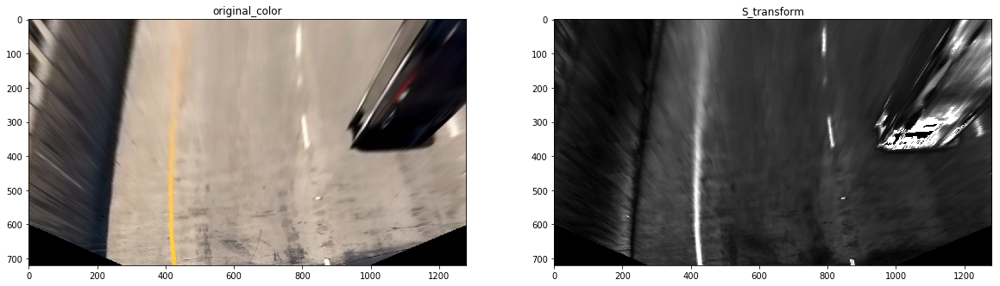

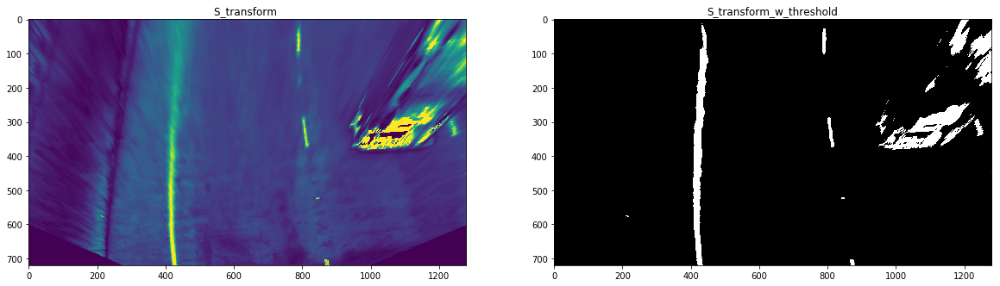

In [17]:
s_img = threshold_color(hls_select(perspective_img, 2, "S"), "S", (125, 255))

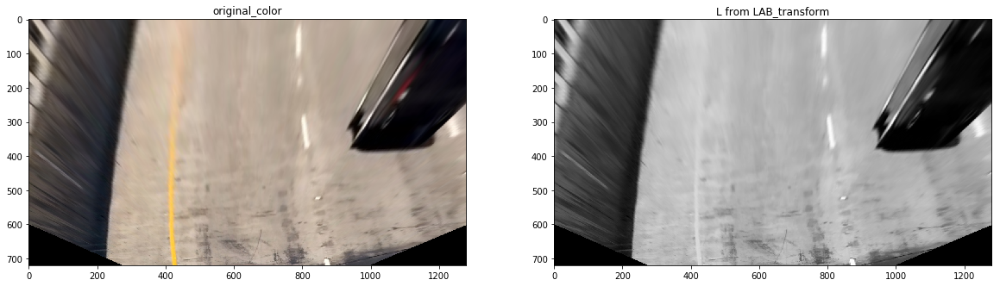

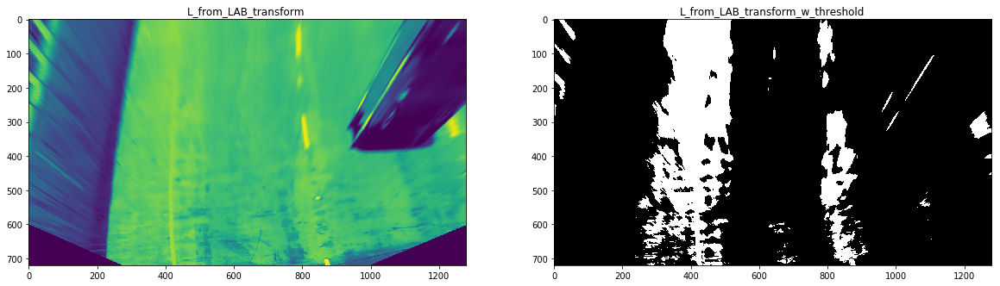

In [18]:
l_img = threshold_color(lab_select(perspective_img, 0, "L from LAB"), "L_from_LAB", (190,255))

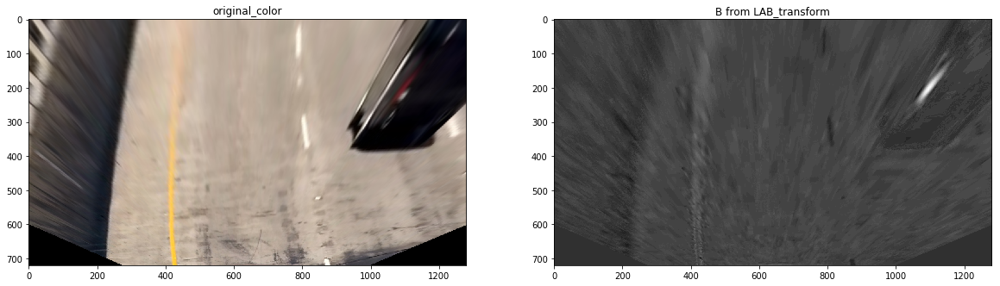

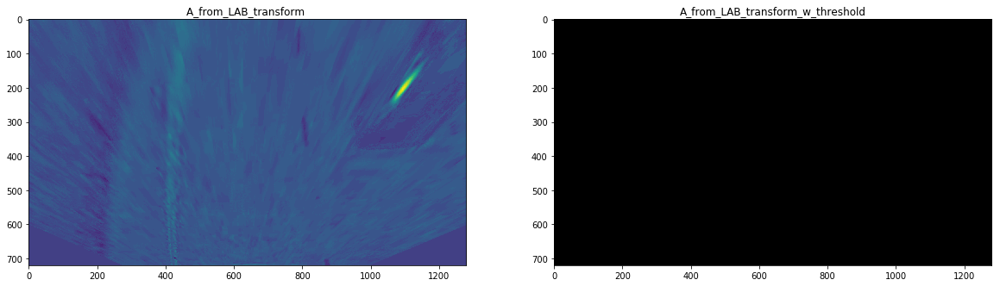

In [19]:
a_img = threshold_color(lab_select(perspective_img, 1, "B from LAB"), "A_from_LAB", (190,255))

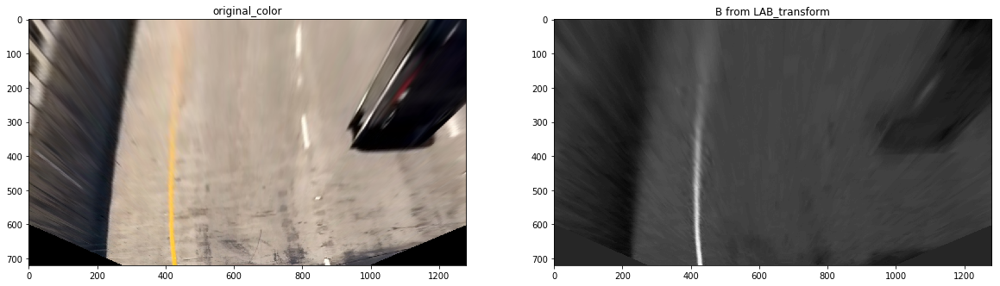

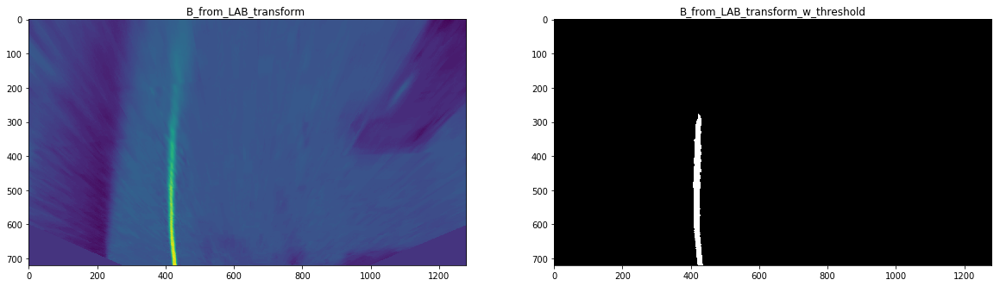

In [20]:
b_img_2 = threshold_color(lab_select(perspective_img, 2, "B from LAB"), "B_from_LAB", (190,255))

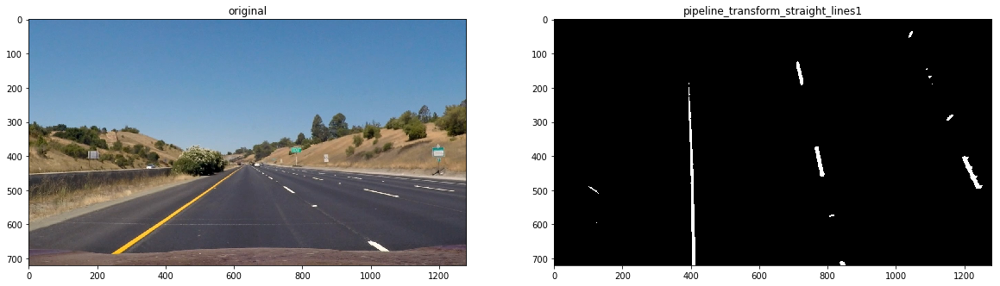

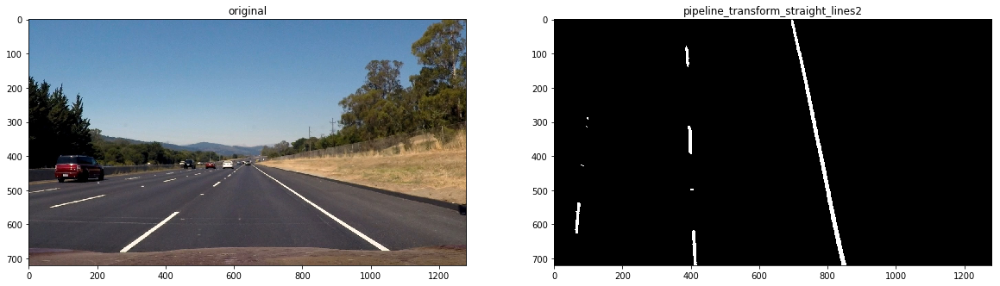

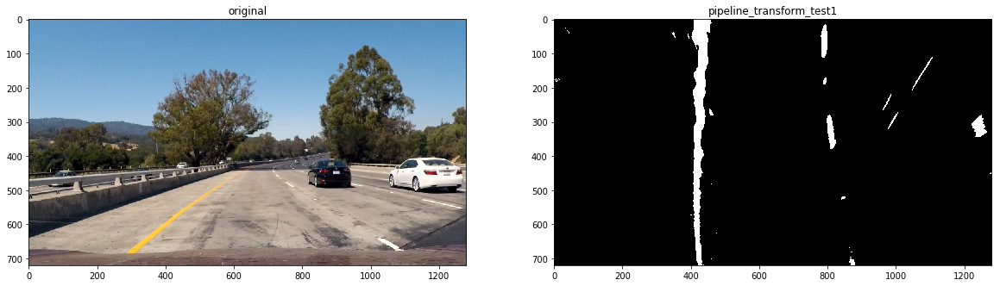

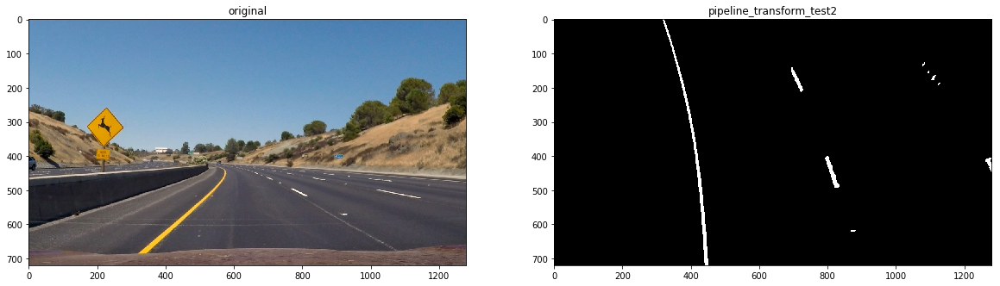

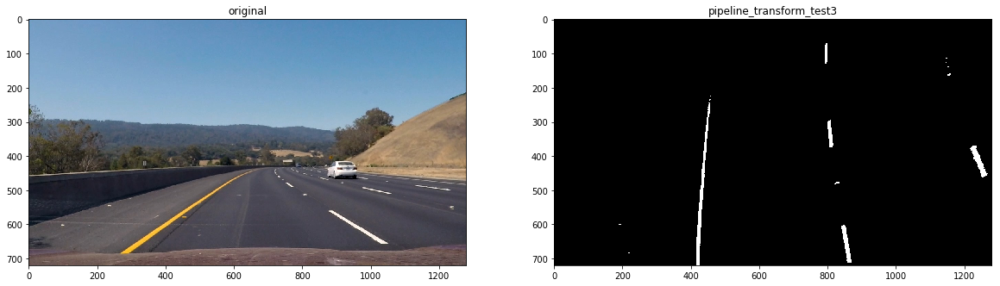

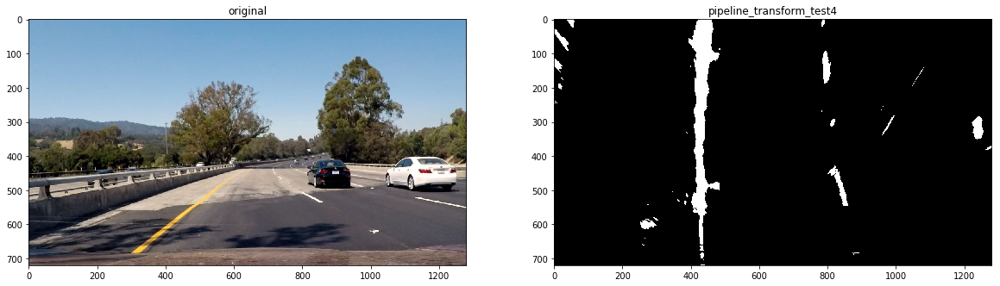

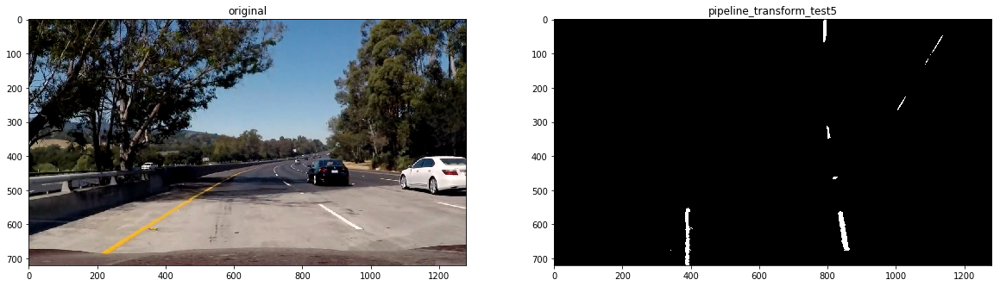

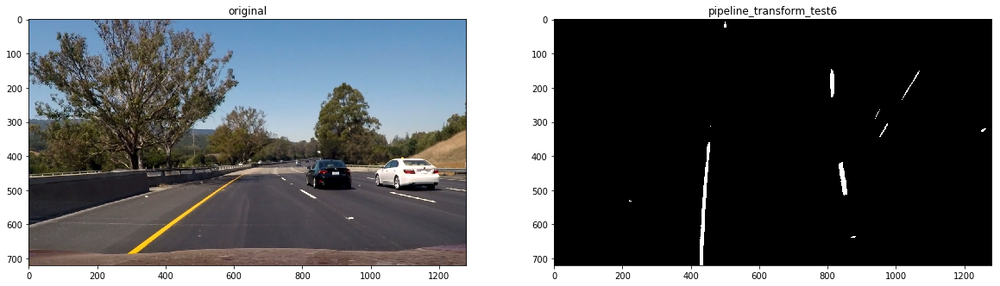

In [21]:
def pipeline(img):
    undistorted_img = undistort(img, display=False, save=False)
    src_pts, dest_pts = get_perspective_transform_points(undistorted_img, display=False)
    
    perspective_img, Minv = perspective_transform(undistorted_img, src_pts, dest_pts, display=False)
    
    #s_img = threshold_color(hls_select(perspective_img, 2, "S", display=False), "S", (125, 255), display=False)
    #b_img_2 = threshold_color(lab_select(perspective_img, 2, "B from LAB", display=False), "B from LAB", (190,255), display=False)
    l_img = threshold_color(hls_select(perspective_img, 1, "L", display=False), "L", (200, 255), display=False)
    r_img = threshold_color(rgb_select(perspective_img, 0, "R", display=False), "R", (220, 255), display=False)
    
    result = np.zeros_like(l_img)
    result[ (l_img == 1) | (r_img == 1)] = 1
    
    # To Remove Shadow use Sobel along X 
    #abs_sobel_thresh_img = abs_sobel_thresh(perspective_img, orient='x', thresh_min=50, thresh_max=255, display = False)
    
    return result, Minv


test_image_directory = './test_images'
for idx, fname in enumerate(os.listdir(test_image_directory)):
    img = get_image(test_image_directory+"/"+fname)
    output_img, Minv = pipeline(img)
    display_images(img, output_img, "original", "pipeline_transform_"+fname.replace('.jpg', ''), True)

<a id="lane_detection"><h2>Calculating Lane Lines</h2></a>

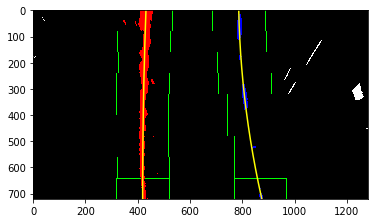

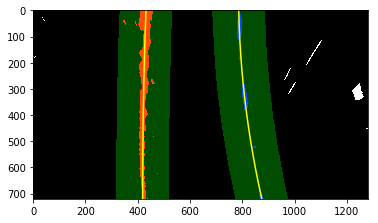

In [22]:
import numpy as np
import cv2
import matplotlib.pyplot as plt



def find_lane_lines_with_window(binary_warped, display=True):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    if display:            
        ## Visualization
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        plt.savefig("./output_images/find_lane_lines_with_window.png")
    return left_fit, right_fit, left_lane_inds, right_lane_inds


def find_lane_lines_without_window(binary_warped, left_fit, right_fit, display=True):
    # Assume you now have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    if display:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        plt.imshow(result)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.show()
        plt.savefig("./output_images/find_lane_lines_without_window.png")
        
    return left_fit, right_fit, left_lane_inds, right_lane_inds
    
file_path = './test_images/test1.jpg'
original_img = get_image(file_path)
output_img, Minv = pipeline(original_img)
left_fit, right_fit, left_lane_inds, right_lane_inds = find_lane_lines_with_window(output_img)
left_fit, right_fit, left_lane_inds, right_lane_inds =  find_lane_lines_without_window(output_img, left_fit, right_fit)

<a id="radius_of_curvature"><h2>Radius of Curvature</h2></a>

In [23]:
def radius_of_curvature_calculation(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

left_curvature, right_curvature, dist_from_center = radius_of_curvature_calculation(output_img, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature:', left_curvature, 'm,', right_curvature, 'm')
print('Distance from lane center for example:', dist_from_center, 'm')

Radius of curvature: 1839.02974297 m, 338.300974036 m
Distance from lane center for example: -0.0646472252574 m


<a id="image_output"><h2> Image Output </h2></a>

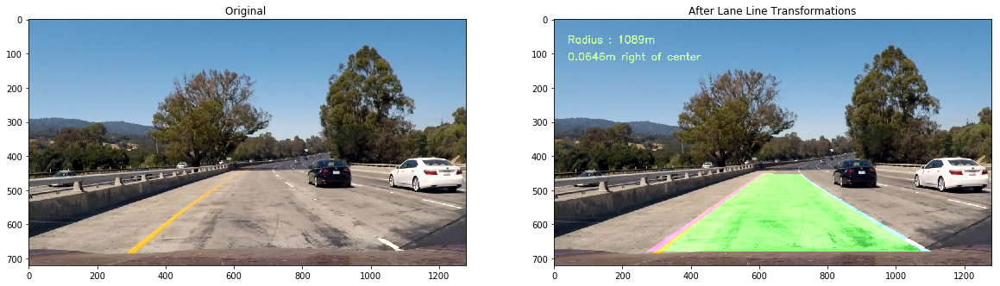

In [24]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv, left_curvature, right_curvature, dist_from_center):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    
    radius = (left_curvature+ right_curvature )/ 2.0
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,  'Radius : ' + '{0:.4g}'.format(radius) + 'm', (40,70), font, 1, (200,255,155), 2, cv2.LINE_AA)
    cv2.putText(result, '{0:.3g}'.format(abs(dist_from_center)) +'m '+['left', 'right'][dist_from_center <0] + ' of center', (40,120), font, 1, (200,255,155), 2, cv2.LINE_AA)
    return result


image_with_lane_lines = draw_lane(original_img, output_img, left_fit, right_fit, Minv, left_curvature, right_curvature, dist_from_center)
display_images(original_img, image_with_lane_lines, "Original ", "After Lane Line Transformations", False, False)

<a id="video_output"><h2>Video Output</h2></a>

In [25]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    
    
    def process(self, new_fit):
        if new_fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(new_fit-self.best_fit)
            if self.diffs[0] > 0.001  and len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.update_current_fit(new_fit)
                self.update_best_fit() 
        else:
            self.detected = False
            self.update_current_fit()
            self.update_best_fit()
            
    def update_current_fit(new_fit):
        if new_fit is not None:
            self.current_fit.append(new_fit)
            if len(self.current_fit) > 5:
                self.current_fit = self.current_fit[len(self.current_fit)-5:]
        else:
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]            
    
    def update_best_fit():
        if len(self.current_fit) > 0:
            self.best_fit = np.average(self.current_fit, axis=0)               

In [26]:
def is_fit_valid(h, l_fit, r_fit):
    l_value = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
    r_value = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
    return abs(400 - abs(r_value - l_value)) > 100

In [27]:
l_line, r_line = Line(), Line()

In [28]:
def video_processing_pipeline(img):
    h, w = img.shape[0], img.shape[1]
    img_bin, Minv = pipeline(np.copy(img))
    
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds = find_lane_lines_with_window(img_bin, display=False)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = find_lane_lines_without_window(img_bin, l_line.best_fit, r_line.best_fit,  display=False)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if is_fit_valid(h, l_fit, r_fit):
        l_fit = None
        r_fit = None
            
    l_line.process(l_fit)
    r_line.process(r_fit)
    
    # draw the current best fit if it exists
    left_curvature, right_curvature, dist_from_center = radius_of_curvature_calculation(img_bin,l_line.best_fit, r_line.best_fit, l_lane_inds, r_lane_inds)
    img_out = draw_lane(img, img_bin, l_line.best_fit, r_line.best_fit, Minv, left_curvature, right_curvature, dist_from_center)
    
    return img_out

In [78]:
from moviepy.editor import VideoFileClip

output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
output_clip = clip1.fl_image(video_processing_pipeline)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



100%|█████████▉| 1260/1261 [15:57<00:00,  1.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 18min 21s, sys: 2.89 s, total: 18min 24s
Wall time: 15min 58s
